# ICML MOSS Workshop: Neural SDEs on Compact State-Spaces

**Authors:** Yue-Jane Liu, Malinda Lu, Matthew K. Nock, Yaniv Yacoby

**Abstract:** 
Many modern probabilistic models rely on SDEs, but their adoption is hampered by instability, poor inductive bias outside bounded domains, and reliance on restrictive dynamics or training tricks. 
While recent work constrains SDEs to compact spaces using reflected dynamics, these approaches lack continuous dynamics and efficient high-order solvers, limiting interpretability and applicability. 
We propose a novel class of neural SDEs on compact polyhedral spaces with continuous dynamics, amenable to higher-order solvers, and with favorable inductive bias.

## Libraries and Settings

In [1]:
import abc

import matplotlib
import matplotlib.pylab as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import seaborn as sns
import numpy as np
import jax.random as jr
import diffrax
import jax.numpy as jnp
import matplotlib
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec
import jax.random as jrandom
import jax
import jax.nn as jnn
import chex

from polyhedron import *
from solver import *
from nn import *
from utils import *
from viz import *

matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['image.origin'] = 'lower'

cmap = sns.color_palette("Reds", as_cmap=True)

## Compact Polyhedral Spaces

The `Polyhedron` class defines polyhedrons by specifying $u_s$, the "shift" vectors, and $v_s$ and vectors normal to each half-space boundary. 
We create several polyhedrons below and visualize them, their vertices, and their Chebyshev centers.

In [2]:
triangle = Polyhedron(
    U=jnp.array([
        [0.0, 0.0],
        [0.0, 0.0],
        [0.5, 0.5],
    ]),
    V=jnp.array([
        [1.0, 0.0],
        [0.0, 1.0],
        [-jnp.sqrt(0.5), -jnp.sqrt(0.5)],
    ]),
    name='Triangle',
)

square = Polyhedron(
    U=jnp.array([
        [0.0, 0.0],
        [0.0, 0.0],
        [1.0, 1.0],
        [1.0, 1.0],
    ]),
    V=jnp.array([
        [1.0, 0.0],
        [0.0, 1.0],
        [-1.0, 0.0],
        [0.0, -1.0],
    ]),
    name='Square',
)

pentagon = Polyhedron(
    U=jnp.array([
        [0.1, 0.1],
        [0.1, 0.1],
        [1.1, 1.1],
        [1.1, 1.1],
        [0.8, 0.8],
    ]),
    V=jnp.array([
        [1.0, 0.1],
        [0.1, 1.0],
        [-1.0, 0.2],
        [0.2, -1.0],
        [-jnp.sqrt(0.5), -jnp.sqrt(0.5)],
    ]),
    name='Pentagon',
)

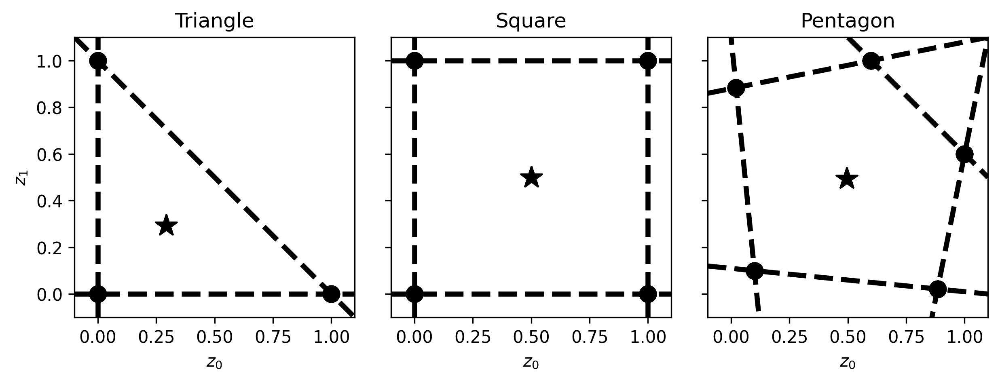

In [3]:
fig = plt.figure(figsize=(10.5, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 3), share_all=True,
    axes_pad=0.3, cbar_pad=0.1,
)

for ax, polyhedron in safe_zip(grid, [triangle, square, pentagon]):
    plot_polyhedron(ax, polyhedron, center=True, vertices=True)
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title(polyhedron.get_name())
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

## Weighted Sums Parameterization (WSP)

The `Weight` represents $w(z)$. It takes in a `Polyhedron`, constants $\alpha > 0$ and $\beta > 0$.
We create an instance of $w(z)$ for every polyhedron above and visualize it, showing it indeed approaches 0 at the boundary and 1 at the interior of the polyhedron.

In [4]:
class Weight():
    def __init__(self, polyhedron, alpha=10.0, beta=100.0):
        self.polyhedron = polyhedron
        self.alpha = alpha
        self.beta = beta

    def get_viz_bounds(self):
        return self.polyhedron.get_viz_bounds()
        
    def __call__(self, z, clip=True):
        d = self.polyhedron.distances_to_boundaries(z)
        
        #w = jnn.tanh(self.beta * jnp.prod(jnn.softmax(-d, axis=0) * jnn.tanh(self.alpha * d), axis=-1))
        w = jnn.tanh(jnp.exp(jnp.log(self.beta) + jnp.sum(jnn.log_softmax(-d, axis=0) + jnp.log(jnn.tanh(self.alpha * d)), axis=-1)))
        chex.assert_shape(w, ())
        
        if clip:
            return w * self.polyhedron.is_feasible(z)
        return w

In [5]:
triangle_w = Weight(triangle, alpha=5.0, beta=100.0)
square_w = Weight(square, alpha=5.0, beta=1000.0)
pentagon_w = Weight(pentagon, alpha=10.0, beta=8000.0)

W = [triangle_w, square_w, pentagon_w]

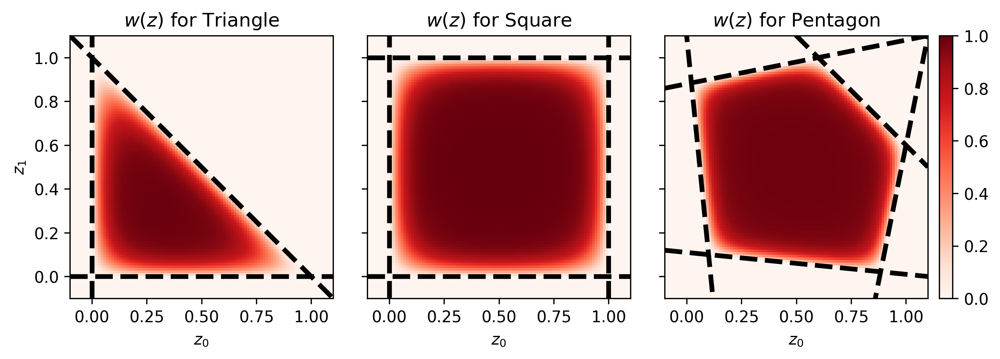

In [6]:
fig = plt.figure(figsize=(10.5, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 3), share_all=True,
    axes_pad=0.3, cbar_pad=0.1,
    cbar_mode='single', 
)

for ax, weight in safe_zip(grid, W):
    X, Y, Z = eval_fn_on_meshgrid(
        lambda z: weight(z, clip=True), 
        weight.get_viz_bounds(), 
        num_points=100,    
    )
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title(r'$w(z)$ for {}'.format(weight.polyhedron.get_name()))
    cbar = ax.pcolormesh(X, Y, Z.squeeze(), cmap=cmap)
    cbar.set_clim(0.0, 1.0)
    ax.cax.colorbar(cbar)   

    plot_polyhedron(ax, weight.polyhedron)
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

Next, we define `ConstraintSatisfyingFn` to represent $c_h(z)$ and $c_g(z)$. 
As in the paper $c_g(z) = 0$, and $c_h(z)$ represents a "push" towards the Chebyshev center of the polyhedron.
Since $c_h(z)$ is the only interesting function here, we visualize it below.

In [7]:
class ConstraintSatisfyingFn:
    @abc.abstractmethod
    def __call__(self, z):
        pass


class DiffusionCSFn(ConstraintSatisfyingFn):
    def __call__(self, z):
        return jnp.zeros_like(z)


class DriftCenterCSFn(ConstraintSatisfyingFn):
    def __init__(self, polyhedron, scale=1.0, epsilon=0.1):
        super().__init__()
        self.polyhedron = polyhedron
        self.scale = scale
        self.epsilon = epsilon
        
    def __call__(self, z):
        h = self.polyhedron.get_chebyshev_center() - z
        h = h / (jnp.linalg.norm(h, axis=-1) + self.epsilon)
        chex.assert_equal_shape((z, h))        
        return h * self.scale


class DriftVertexCSFn(ConstraintSatisfyingFn):
    def __init__(self, polyhedron, scale=1.0):
        super().__init__()
        self.polyhedron = polyhedron
        self.scale = scale
        
    def __call__(self, z):
        v = self.polyhedron.get_vertices()
        d = jnp.linalg.norm(v - z, axis=-1)
        w = jnn.softmax(d, axis=-1)

        h = jnp.sum((v - z) * w[..., None], axis=0)
        chex.assert_equal_shape((z, h))        
        
        return h * self.scale

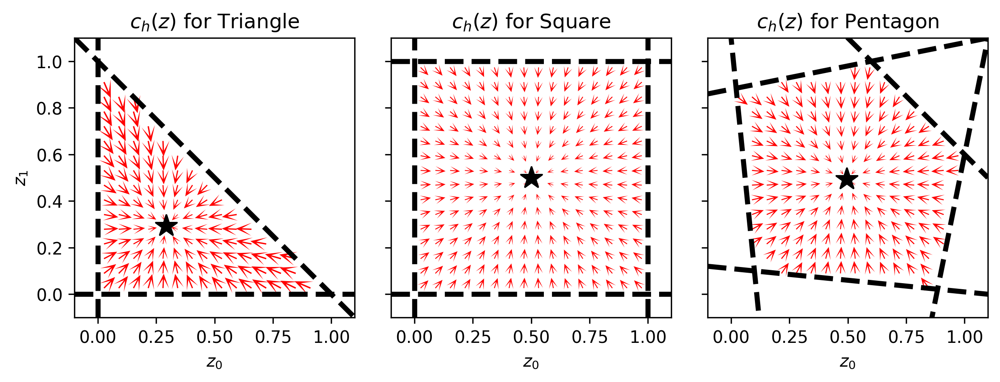

In [8]:
fig = plt.figure(figsize=(10.5, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 3), share_all=True,
    axes_pad=0.3, cbar_pad=0.1,
)

for ax, weight in safe_zip(grid, W):
    drift_csf = DriftCenterCSFn(weight.polyhedron)
    
    X, Y, Z = eval_fn_on_meshgrid(
        lambda z: drift_csf(z), 
        weight.get_viz_bounds(), 
        num_points=20,    
    )

    is_feasible = eval_fn_on_meshgrid(
        lambda z: drift_csf.polyhedron.is_feasible(z), 
        weight.get_viz_bounds(), 
        num_points=20,    
    )[-1].squeeze()
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title(r'$c_h(z)$ for {}'.format(weight.polyhedron.get_name()))
    ax.quiver(
        X[is_feasible], Y[is_feasible], 
        Z[is_feasible, 0], Z[is_feasible, 1], 
        angles='xy', 
        headwidth=10, headlength=12, 
        color='red',
    )   

    plot_polyhedron(ax, weight.polyhedron, center=True)
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

Finally, we define `WSP` as a convex combination of the target function $f$ and our constraint satisfying functions $c_h$ and $c_g$.
After arbitrarily picking some target drift (that looks like a spiral) and target diffusion (that looks like a wave), we show that WSP transforms them to satisfy the constraints (a) and (b) from our theorems, ensuring the solved dynamics lie within their respective polyhedra.

In [9]:
class WSP:
    def __init__(self, weight, csf, target_fn):
        self.weight = weight
        self.csf = csf
        self.target_fn = target_fn

    def __call__(self, t, z, args):
        weight = self.weight(z)
        return weight * self.target_fn(t, z, args) + (1.0 - weight) * self.csf(z)

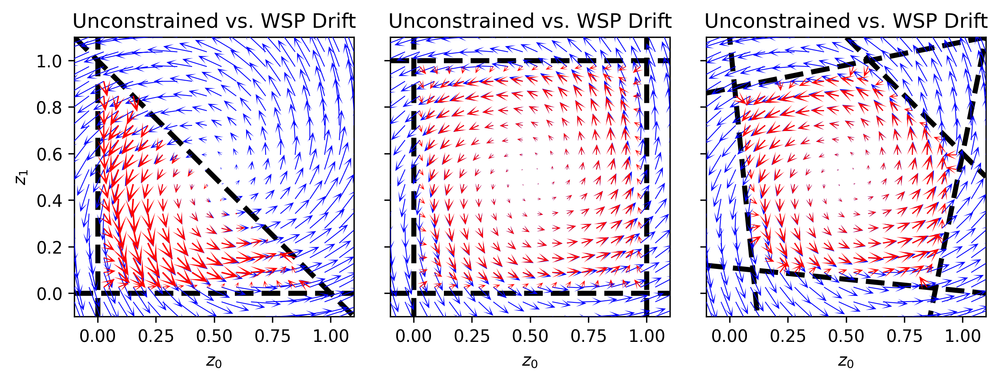

In [10]:
def drift_original(t, z, args, a=-0.5, b=5.0, c=0.5):
    chex.assert_shape(z, (2,))
    z = z - 0.5
    h1 = a * z[0] - b * z[1]
    h2 = b * z[0] + a * z[1]
    return jnp.array([h1 + c * h2, h2 - c * h1])

fig = plt.figure(figsize=(10.5, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 3), share_all=True,
    axes_pad=0.3, cbar_pad=0.1,
)

for ax, weight in safe_zip(grid, W):
    drift_wsp = WSP(
        weight,
        DriftCenterCSFn(weight.polyhedron, scale=2.0),
        drift_original,
    )
    
    X, Y, Z = eval_fn_on_meshgrid(
        lambda z: drift_wsp(None, z, None), 
        weight.get_viz_bounds(), 
        num_points=20,    
    )

    is_feasible = eval_fn_on_meshgrid(
        lambda z: weight.polyhedron.is_feasible(z), 
        weight.get_viz_bounds(), 
        num_points=20,    
    )[-1].squeeze()
    
    q = ax.quiver(
        X[is_feasible], Y[is_feasible], 
        Z[is_feasible, 0], Z[is_feasible, 1], 
        angles='xy', 
        headwidth=10, headlength=12, 
        color='red', 
        zorder=10,
    )   
    q._init()
    
    X, Y, Z = eval_fn_on_meshgrid(
        lambda z: drift_original(None, z, None), 
        weight.get_viz_bounds(), 
        num_points=20,    
    )

    ax.quiver(
        X, Y, 
        Z[..., 0], Z[..., 1], 
        angles='xy',
        headwidth=10, headlength=12, 
        color='blue', 
        scale=q.scale,
        zorder=9,
    )   
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title('Unconstrained vs. WSP Drift')

    plot_polyhedron(ax, weight.polyhedron)
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

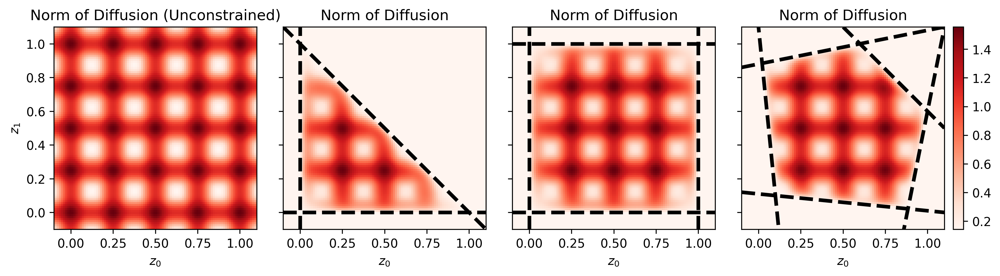

In [11]:
def diffusion_original(t, z, args):
    chex.assert_shape(z, (2,))
    return jnp.cos(4.0 * jnp.pi * z) ** 2.0  + 0.1


fig = plt.figure(figsize=(14, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 4), share_all=True,
    axes_pad=0.3, cbar_pad=0.1,
    cbar_mode='single', 
)

X, Y, Z = eval_fn_on_meshgrid(
    lambda z: jnp.linalg.norm(diffusion_original(None, z, None), axis=-1), 
    (-0.1, 1.1, -0.1, 1.1), 
    num_points=100,    
)
    
grid[0].set_xlabel(r'$z_0$')
grid[0].set_title('Norm of Diffusion (Unconstrained)')
cbar = grid[0].pcolormesh(X, Y, Z.squeeze(), cmap=cmap)
grid[0].cax.colorbar(cbar)    

for ax, weight in safe_zip(grid[1:], W):
    diffusion_wsp = WSP(
        weight,
        DiffusionCSFn(),
        diffusion_original,
    )
    
    X, Y, Z = eval_fn_on_meshgrid(
        lambda z: jnp.linalg.norm(diffusion_wsp(None, z, None), axis=-1), 
        weight.get_viz_bounds(), 
        num_points=100,    
    )
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title('Norm of Diffusion')
    cbar = ax.pcolormesh(X, Y, Z.squeeze(), cmap=cmap)   

    plot_polyhedron(ax, weight.polyhedron)
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

## SDE Parameterizations

We now construct different classes representing each dynamics. 
We note that dynamics based on the chain rule (Eqns. 2 and 3) are only meant to be used on $K = [0, 1]$.

In [12]:
class Dynamics:
    '''
    Dynamics from Equation 1
    '''

    def __init__(self, drift_fn, diffusion_fn):
        self.drift_fn = drift_fn
        self.diffusion_fn = diffusion_fn

    def drift(self, t, x, args):
        return self.drift_fn(t, x, args)

    def diffusion(self, t, x, args):
        return self.diffusion_fn(t, x, args)

    def __str__(self):
        return 'Unconstrained (Eq. 1)'

In [13]:
class ItoDynamics(Dynamics):
    '''
    Dynamics from Equation 2 
    Only for unit cube state spaces
    '''

    def __init__(self, *args, tol=1e-8, **kwargs):
        super().__init__(*args, **kwargs)
        self.tol = tol

    def drift(self, t, x, args):
        return super().drift(t, inv_sigmoid(x, tol=self.tol), args) * (x - x**2) + (
            super().diffusion(t, inv_sigmoid(x, tol=self.tol), args) / 2
        ) * (2 * x**3 - 3 * x**2 + x)

    def diffusion(self, t, x, args):
        return super().diffusion(t, inv_sigmoid(x, tol=self.tol), args) * (x - x**2)

    def __str__(self):
        return 'Ito (Eq. 2)'

In [14]:
class AbsorbedItoDynamics(Dynamics):
    '''
    Dynamics from Equation 3
    Only for unit cube state spaces
    '''

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def drift(self, t, x, args):
        return super().drift(t, x, args) * (x - x**2) + (
            super().diffusion(t, x, args) / 2
        ) * (2 * x**3 - 3 * x**2 + x)

    def diffusion(self, t, x, args):
        return super().diffusion(t, x, args) * (x - x**2)

    def __str__(self):
        return 'Ito (Eq. 3)'

In [15]:
class StratonovichDynamics(Dynamics):
    '''
    Dynamics from Equation 2 (Stratonovich Version)
    Only for unit cube state spaces
    '''

    def __init__(self, *args, tol=1e-8, **kwargs):
        super().__init__(*args, **kwargs)
        self.tol = tol

    def drift(self, t, x, args):
        return super().drift(t, inv_sigmoid(x, tol=self.tol), args) * (x - x**2)

    def diffusion(self, t, x, args):
        return super().diffusion(t, inv_sigmoid(x, tol=self.tol), args) * (x - x**2)

    def __str__(self):
        return 'Stratonovich (Eq. 2)'

In [16]:
class AbsorbedStratonovichDynamics(Dynamics):
    '''
    Dynamics from Equation 3 (Stratonovich Version)
    Only for unit cube state spaces
    '''

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def drift(self, t, x, args):
      return super().drift(t, x, args) * (x - x**2)

    def diffusion(self, t, x, args):
      return super().diffusion(t, x, args) * (x - x**2)

    def __str__(self):
        return 'Stratonovich (Eq. 3)'

In [17]:
class StationaryWSPDynamics(Dynamics):
    '''
    Dynamics with diffusion from Equation 4 and with drift from Theorem 3.3
    '''

    def __init__(self, diffusion_fn_pre, log_unnormalized_pz, weight, args=None):
        self.log_unnormalized_pz = log_unnormalized_pz

        diffusion_fn = WSP(
            weight,
            DiffusionCSFn(),
            diffusion_fn_pre,
        )

        diffusion_sq_grad = jax.grad(lambda t, z, args: diffusion_fn(t, z, args).squeeze() ** 2.0, argnums=1)
        log_unnormalized_pz_grad = jax.grad(lambda t, z: log_unnormalized_pz(t, z).squeeze(), argnums=1)

        def drift_fn(t, x, args):
            return 0.5 * (
                diffusion_sq_grad(t, x, args)
                + (diffusion_fn(t, x, args) ** 2.0) * log_unnormalized_pz_grad(t, x)
            )

        super().__init__(drift_fn, diffusion_fn)

    def __str__(self):
        return 'Stationary WSP (Eq. 4 + Thm 3.3)'
        

In [18]:
class WSPDynamics(Dynamics):
    '''
    Dynamics from Equation 4
    '''

    def __init__(self, drift_fn, diffusion_fn, weight, scale=1.0):
        super().__init__(drift_fn, diffusion_fn)

        self.drift_wsp = WSP(
            weight,
            DriftCenterCSFn(weight.polyhedron, scale=scale),
            super().drift,
        )

        self.diffusion_wsp = WSP(
            weight,
            DiffusionCSFn(),
            super().diffusion,
        )

    def drift(self, t, x, args):
        return self.drift_wsp(t, x, args)

    def diffusion(self, t, x, args):
        return self.diffusion_wsp(t, x, args)

    def __str__(self):
        return 'WSP (Eq. 4)'

## Demo in 2D

Now we're ready to simulate WSP-transformed SDE dynamics. Notice that our solutions lie within their respective polyhedra.

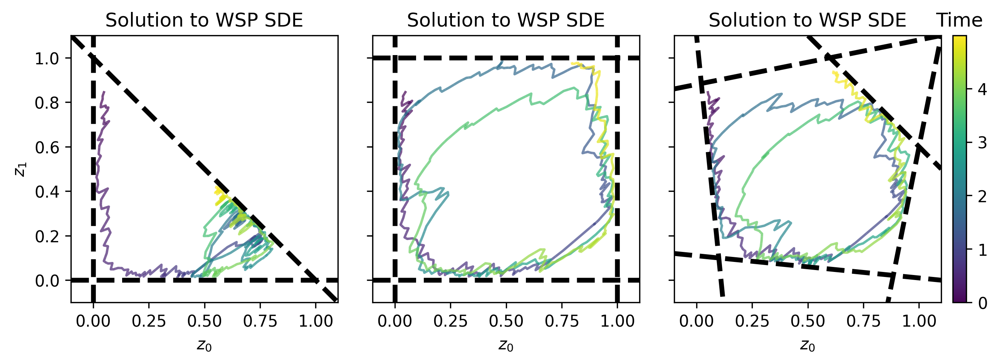

In [19]:
fig = plt.figure(figsize=(10.5, 3))
grid = ImageGrid(
    fig, 111, nrows_ncols=(1, 3), share_all=True,
    axes_pad=0.3, cbar_pad=0.1, cbar_mode='single',
)

for ax, weight in safe_zip(grid, W):
    key = jrandom.PRNGKey(seed=0)

    model = WSPDynamics(
        drift_original, 
        lambda t, z, args: 0.3, 
        weight, 
        scale=2.0,
    )

    x0 = jnp.array([0.05, 0.85])
    ts = jnp.arange(0.0, 5.0, 0.01)
    solver = diffrax.ItoMilstein()
    
    xs = solve_sde(
        model, x0, ts, key, solver, dt0=0.01,
    )

    cbar = parametric_plot(xs[:, 0], xs[:, 1], ts, ax, alpha=0.7)
    ax.cax.colorbar(cbar)  
    ax.cax.set_title('Time') 
    
    ax.set_xlabel(r'$z_0$')
    ax.set_title('Solution to WSP SDE')

    plot_polyhedron(ax, weight.polyhedron)
    ax.set_xlim(polyhedron.get_viz_bounds()[:2])
    ax.set_ylim(polyhedron.get_viz_bounds()[2:])

grid[0].set_ylabel(r'$z_1$')
plt.show()

## Comparison of Inductive Biases of Ito SDEs in 1D

Initialization plays a crucial role in the success of expressive SDE-based models.
Thus, to empirically compare the inductive bias of WSP against baselines, we solve SDEs given by NN drifts and diffusions with randomly sampled weights, and with $z_0$ near the boundary to compare their inductive biases.

*While simple, these preliminary experiments already show a stark improvement in inductive bias of WSP compared to baselines.*
Below, we see that WSP ensures SDE samples are viable in $K = [0, 1]$.
In contrast, unconstrained SDEs quickly leave $K$, and SDEs based on Ito's lemma stick to the boundary, limiting their expressivity.

In [20]:
SEEDS = range(5)
LAYERS = [1, 64, 64, 64, 1]
ACTIVATION_FN = jnn.gelu
TS = jnp.arange(0.0, 5.0, 0.01)
X0 = jnp.array([0.99])
DT0 = 0.001
R = 40

In [21]:
def plot_results(
        ax,
        dynamics_cls,
        solver,
        activation=ACTIVATION_FN,
        ts=TS,
        x0=X0,
        dt0=0.001,
        layers=LAYERS,
        truncated=None,
):
    for seed in SEEDS:
        key = jrandom.PRNGKey(seed=seed)
        key_drift, key_diffusion, key_sample = jrandom.split(key, 3)

        drift = NeuralNetwork(
            layers,
            key_drift,
            activation,
            None,
        )

        diffusion = NeuralNetwork(
            layers,
            key_diffusion,
            activation,
            jnn.softplus,
        )

        model = dynamics_cls(drift, diffusion)

        xs = jax.vmap(lambda key_s: solve_sde(
            model, x0, ts, key_s, solver, truncated=truncated, dt0=dt0,
        ))(jrandom.split(key_sample, 3))

        ax.plot(ts, xs.squeeze().T)

    ax.set_ylabel(str(model))
    ax.set_xlim([ts[0], ts[-1]])
    style_ax(ax, remove_yticks=((jnp.max(xs) > 2.0) | (jnp.min(xs) < -1.0)).any())

In [22]:
line = Polyhedron(
    U=jnp.array([
        [0.0],
        [1.0],
    ]),
    V=jnp.array([
        [1.0],
        [-1.0],
    ]),
    name='Line',
)

line_w = Weight(line, alpha=10.0, beta=10.0)

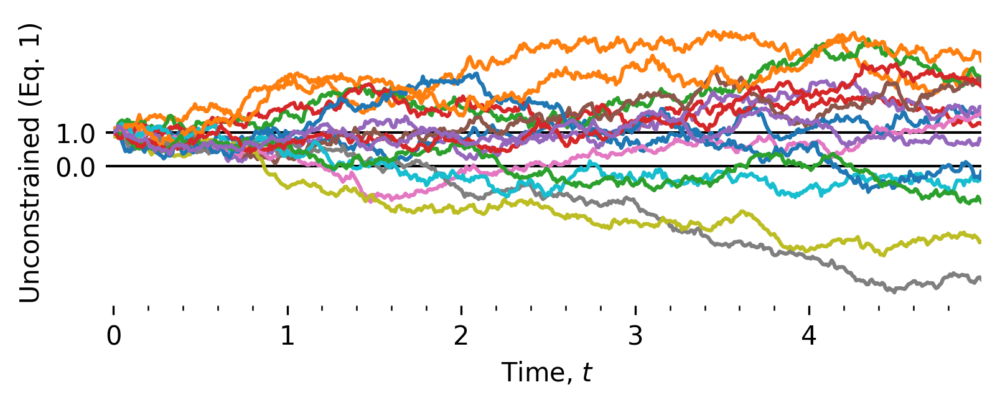

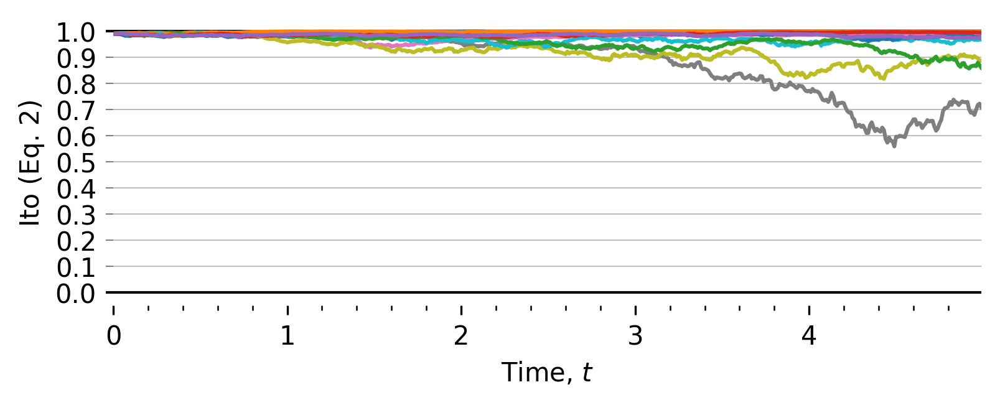

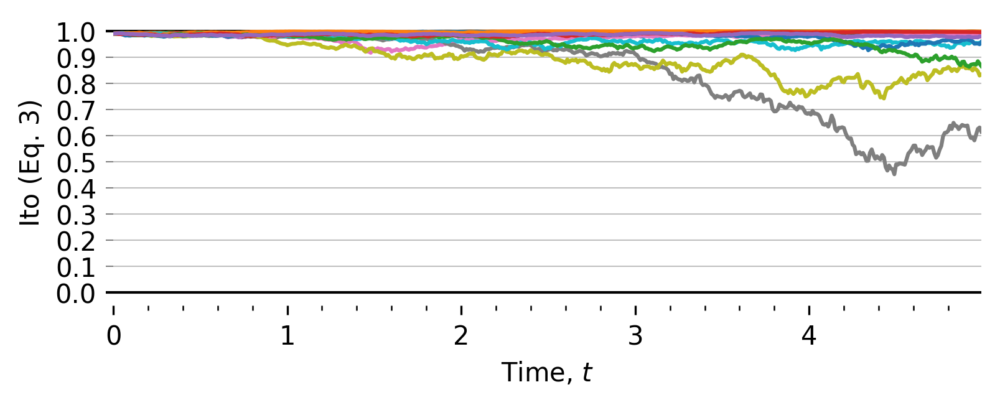

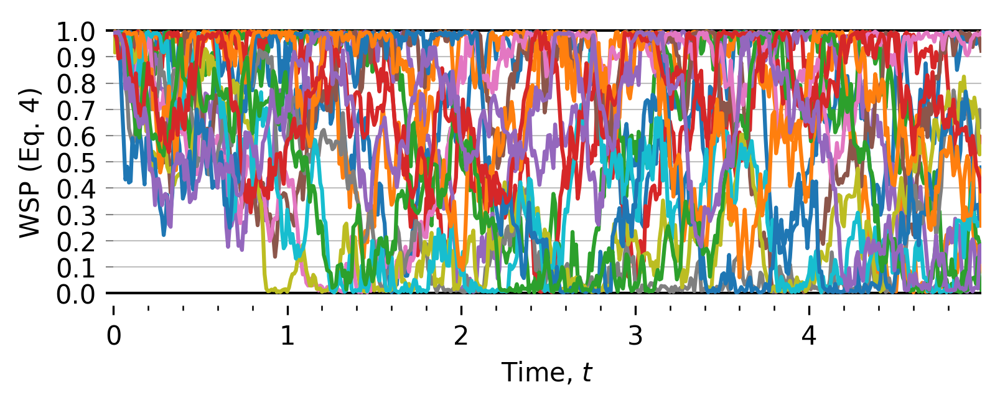

In [23]:
dynamics_cls = [
    Dynamics,
    ItoDynamics,
    AbsorbedItoDynamics,
    lambda h, g: WSPDynamics(h, g, line_w, scale=2.0),
]

for cls in dynamics_cls:
    fig, ax = plt.subplots(1, 1, figsize=(6, 2))
    plot_results(ax, cls, diffrax.ItoMilstein())
    plt.show()

## Comparison of Inductive Biases of Pathwise Approximations of Stratonovich SDEs in 1D

Here we demonstrate WSP's favorable inductive bias also when Brownian motion is replaced with a smooth, pathwise expansion, which allows us to replace the SDE solver with a fast, adaptive ODE solver.

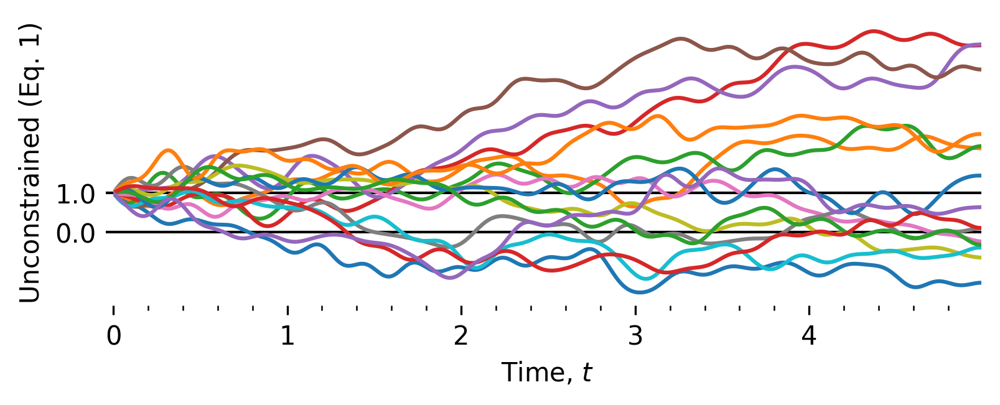

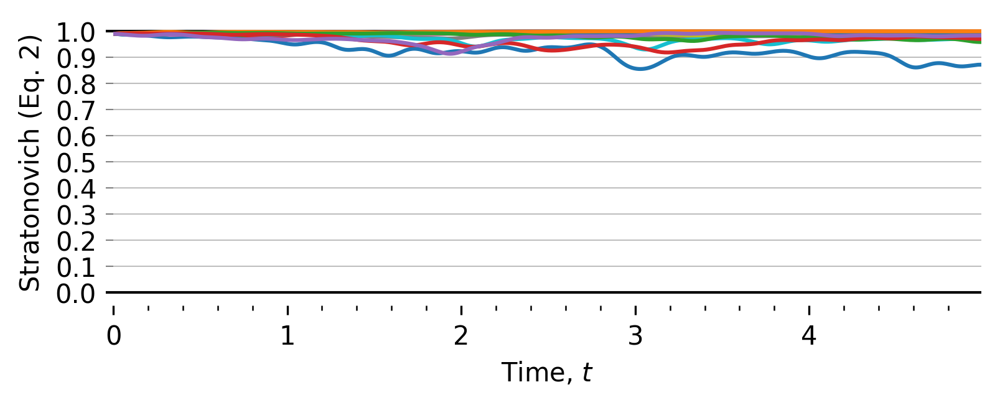

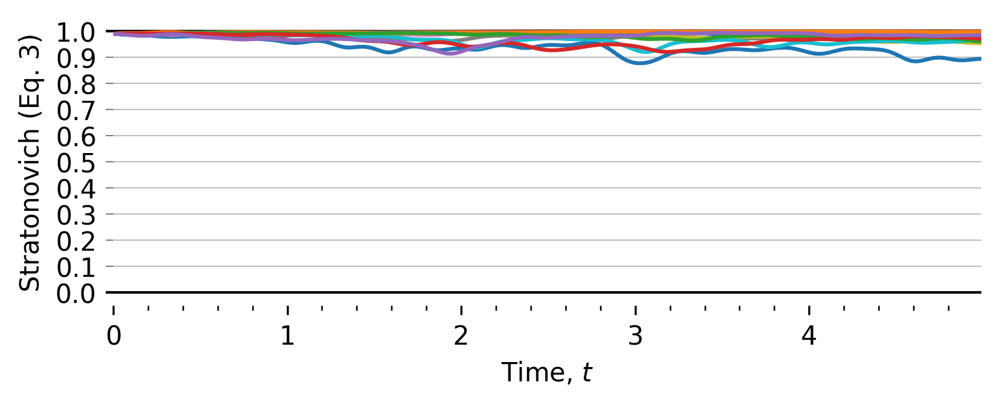

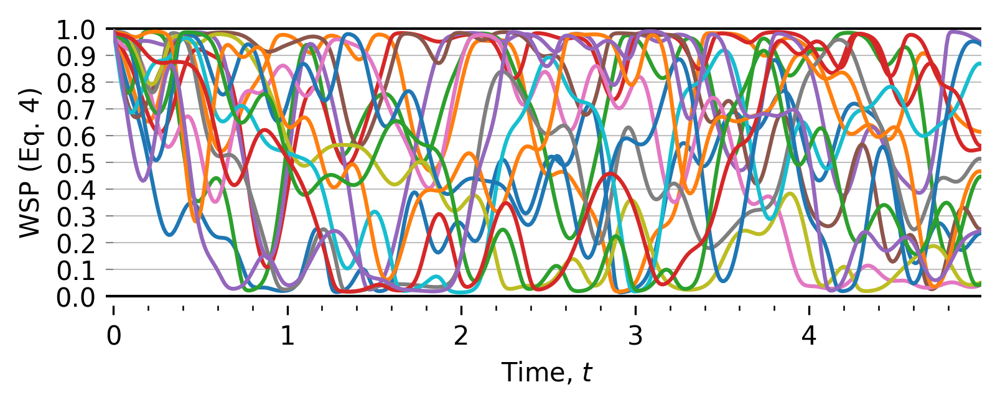

In [24]:
dynamics_cls = [
    Dynamics,
    StratonovichDynamics,
    AbsorbedStratonovichDynamics,
    lambda h, g: WSPDynamics(h, g, line_w, scale=2.0),
]

for cls in dynamics_cls:
    fig, ax = plt.subplots(1, 1, figsize=(6, 2))
    plot_results(ax, cls, diffrax.Dopri8(), truncated=40)
    plt.show()

## Demo of Stationary SDEs on Compact Polyhedra in 1D

Finally, we now show that the stationary SDE from boasts the same favorable inductive bias, allowing us to match any target time-marginal. 

In [25]:
def plot_results_stationary(
        unnormalized_log_pz,
        solver,
        activation=ACTIVATION_FN,
        ts=TS,
        layers=LAYERS,
        dt0=0.001,
        truncated=None,
):
    #fig = plt.figure(figsize=(12.0, 5.5))
    fig = plt.figure(figsize=(12.0, 4.5))

    gs = gridspec.GridSpec(2, 4, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[0, 2])
    ax4 = fig.add_subplot(gs[0, 3])
    ax5 = fig.add_subplot(gs[1, :])

    x_viz = jnp.linspace(0.0, 1.0, 100)
    ax1.fill_between(
        x_viz,
        jnp.zeros_like(x_viz),
        jnp.exp(unnormalized_log_pz(None, x_viz)),
        color='black',
    )
    ax1.set_xlabel(r'$z_t$')
    ax1.set_ylabel(r'$\tilde{p}(z_t)$, unnormalized')
    ax1.set_title('Target Time-Marginal')

    all_xs = []
    for seed in SEEDS:
        key = jrandom.PRNGKey(seed=seed)
        key_diffusion, key_sample, key_x0 = jrandom.split(key, 3)

        diffusion = NeuralNetwork(
            layers,
            key_diffusion,
            activation,
            jnn.softplus,
        )

        model = StationaryWSPDynamics(diffusion, unnormalized_log_pz, line_w)

        ax3.plot(x_viz, jax.vmap(lambda x: model.drift(None, x, None))(x_viz[..., None]))
        ax4.plot(x_viz, jax.vmap(lambda x: model.diffusion(None, x, None))(x_viz[..., None]))

        xs = jax.vmap(lambda key_s, key_x0: solve_sde(
            model, jrandom.uniform(key_x0, shape=(1,)), ts, key_s, solver, dt0=dt0, truncated=truncated,
        ))(jrandom.split(key_sample, 3), jrandom.split(key_x0, 3))

        all_xs.append(xs)

        ax5.plot(ts, xs.squeeze().T)

    all_xs = jnp.concatenate(all_xs).flatten()

    ax5.set_ylabel(r'$z_t$')
    ax5.set_xlim([ts[0], ts[-1]])
    style_ax(ax5, remove_yticks=((jnp.max(xs) > 2.0) | (jnp.min(xs) < -1.0)).any())

    ax2.hist(all_xs, bins=50, density=True, color='black')
    ax2.set_xlabel(r'$z_t$')
    ax2.set_ylabel(r'$p(z_t)$, normalized')
    ax2.set_title('Simulated Time-Marginal')

    ax3.set_xlabel(r'$z_t$')
    ax3.set_ylabel(r'$h(z_t)$')
    ax3.set_title('Drift from Theorem 3.3')

    ax4.set_xlabel(r'$z_t$')
    ax4.set_ylabel(r'$g(z_t)$')
    ax4.set_title('Neural Diffusion with WSP')

    plt.tight_layout()
    plt.show()

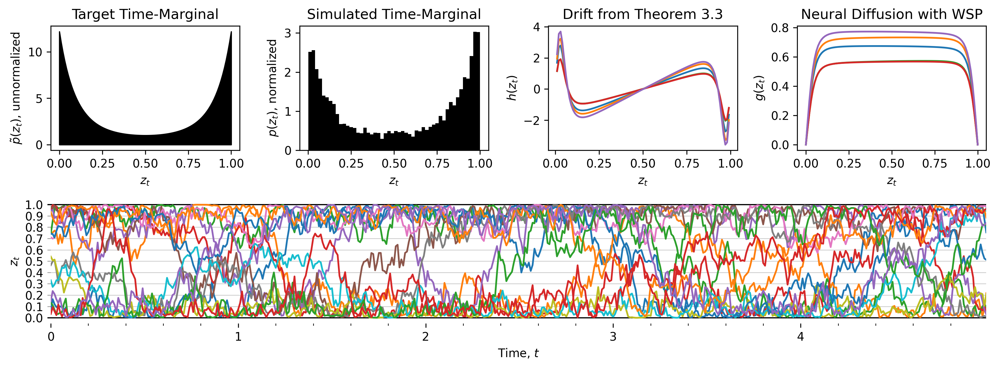

In [26]:
plot_results_stationary(
    lambda t, x: jnp.where((0.0 <= x) & (x <= 1.0), 10.0 * (x - 0.5) ** 2.0, 0.0),
    diffrax.ItoMilstein(),
)

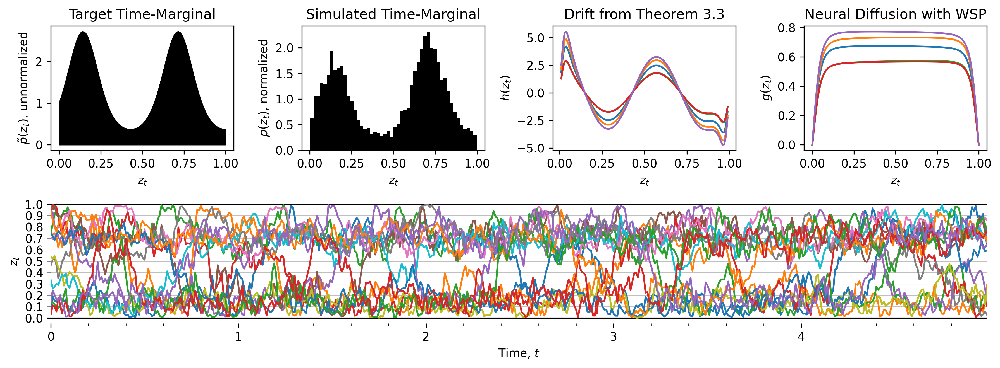

In [27]:
plot_results_stationary(
    lambda t, x: jnp.where((0.0 <= x) & (x <= 1.0), jnp.sin(3.5 * jnp.pi * x), 0.0),
    diffrax.ItoMilstein(),
)

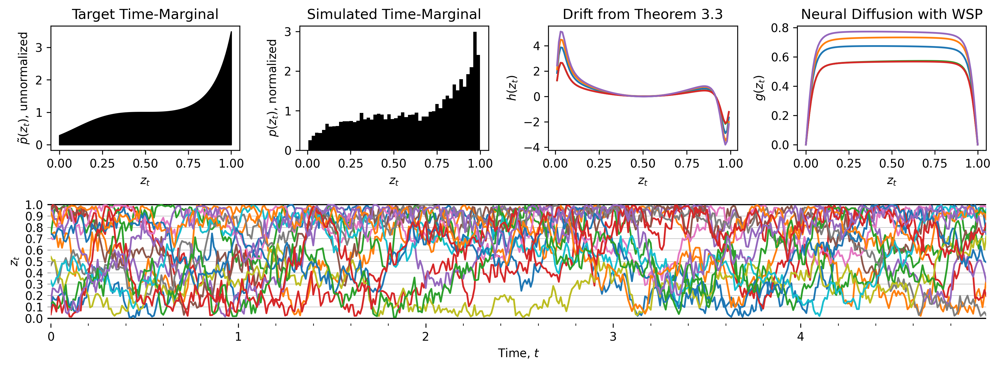

In [28]:
plot_results_stationary(
    lambda t, x: jnp.where((0.0 <= x) & (x <= 1.0), 10.0 * (x - 0.5) ** 3.0, 0.0),
    diffrax.ItoMilstein(),
)

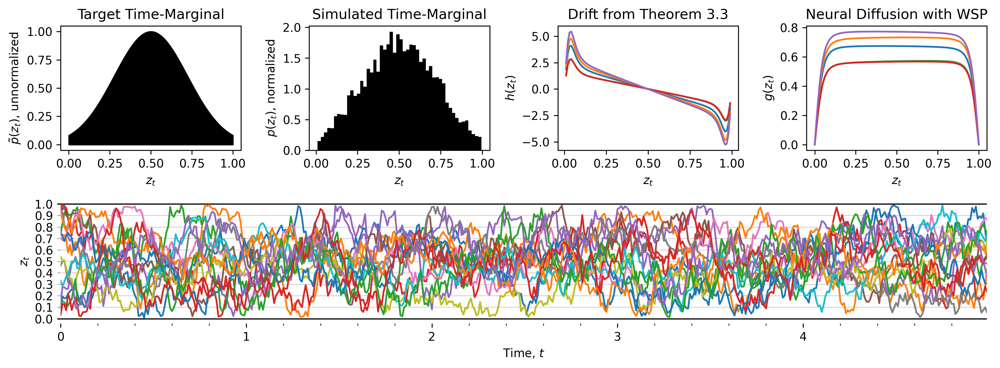

In [29]:
plot_results_stationary(
    lambda t, x: jnp.where((0.0 <= x) & (x <= 1.0), -10.0 * (x - 0.5) ** 2.0, 0.0),
    diffrax.ItoMilstein(),
)